In [ ]:
!wget https://hf.co/danjacobellis/walloc/resolve/main/Stereo_Li_192c_J8_nf8_v1.0.2.pth

In [1]:
import io
import torch
import torchaudio
import matplotlib.pyplot as plt
from IPython.display import Audio
from walloc import walloc
class Config: pass

In [2]:
device = "cpu"
checkpoint = torch.load("Stereo_Li_192c_J8_nf8_v1.0.2.pth",map_location="cpu",weights_only=False)
codec_config = checkpoint['config']
codec = walloc.Codec1D(
    channels = codec_config.channels,
    J = codec_config.J,
    Ne = codec_config.Ne,
    Nd = codec_config.Nd,
    latent_dim = codec_config.latent_dim,
    latent_bits = codec_config.latent_bits,
    lightweight_encode = codec_config.lightweight_encode,
    post_filter = codec_config.post_filter
)
codec.load_state_dict(checkpoint['model_state_dict'])
codec = codec.to(device)
codec.eval();

/home/dgj335/.local/lib/python3.10/site-packages/torch/nn/utils/weight_norm.py:134: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


In [3]:
L = 2**20
x, fs = torchaudio.load("stereo_codec_test_signal.wav")
x = torchaudio.transforms.Resample(fs, 44100)(x)[:,:L]

In [4]:
Audio(x.numpy(),rate=44100)

In [6]:
with torch.no_grad():
    y, _, _ = codec(x.unsqueeze(0))
    y = y[0]

In [7]:
Audio(y,rate=44100)

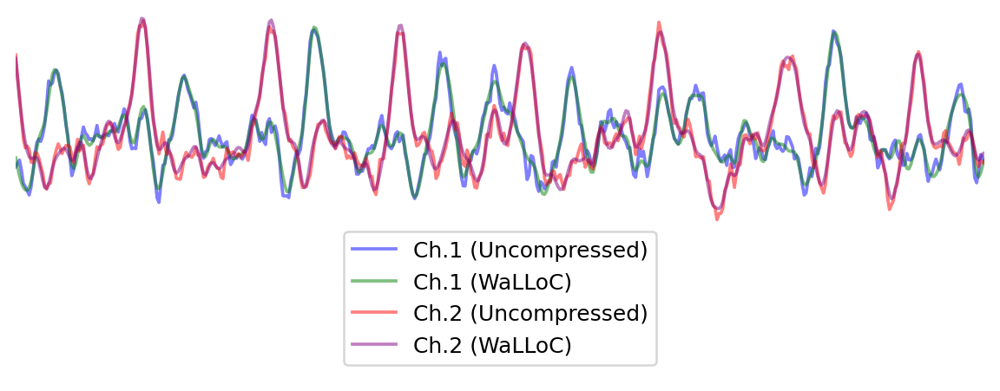

In [37]:
start, end = 564000, 566000
plt.figure(figsize=(8, 3), dpi=180)
plt.plot(x[0, start:end], alpha=0.5, c='b', label='Ch.1 (Uncompressed)')
plt.plot(y[0, start:end], alpha=0.5, c='g', label='Ch.1 (WaLLoC)')
plt.plot(x[1, start:end], alpha=0.5, c='r', label='Ch.2 (Uncompressed)')
plt.plot(y[1, start:end], alpha=0.5, c='purple', label='Ch.2 (WaLLoC)')

plt.xlim([0,500])
plt.ylim([-0.6,0.3])
plt.legend(loc='lower center')
plt.box(False)
plt.xticks([])
plt.yticks([])
plt.savefig("test.svg")